unet\diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
text_encoder\model.safetensors not found


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

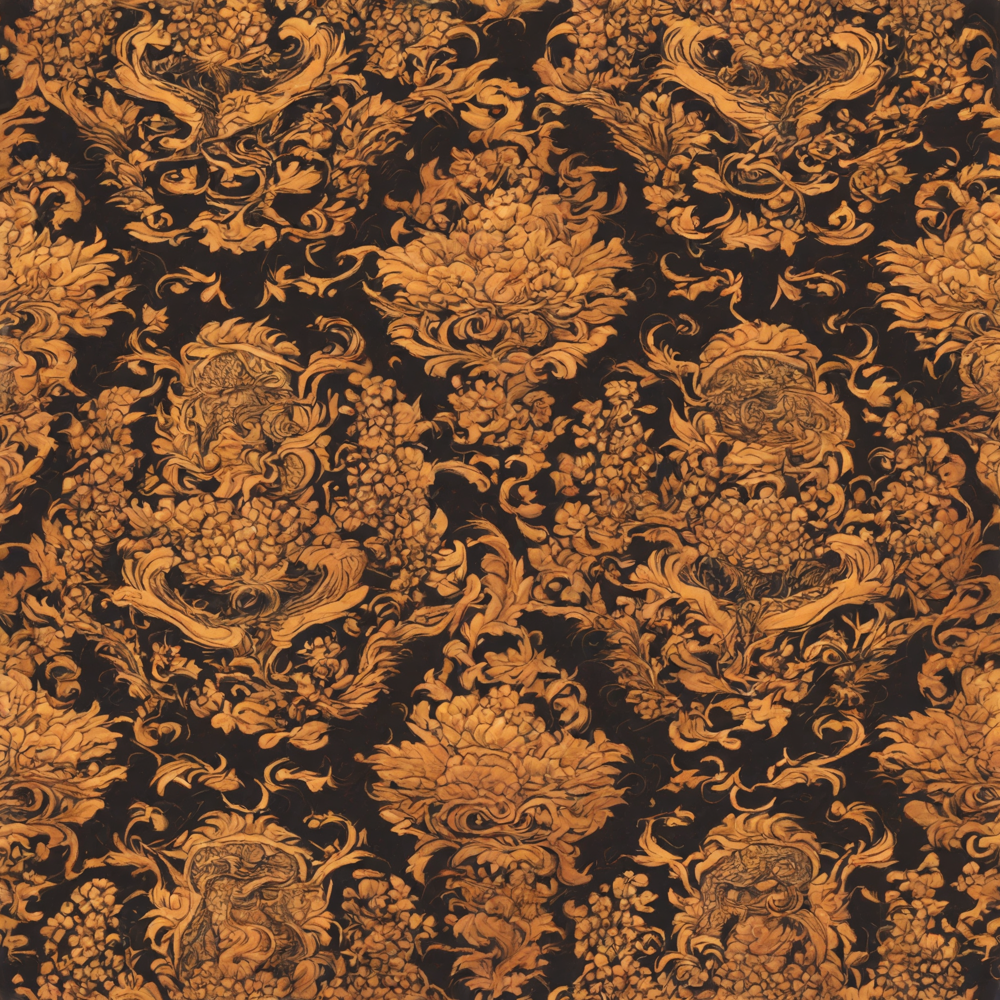

In [1]:
####### Upscaler model 2 to 2048px #######
from diffusers import StableDiffusionLatentUpscalePipeline, StableDiffusionPipeline
import torch
import PIL
from PIL import Image
from torch.utils.checkpoint import checkpoint

device = "cuda"
pipeline = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to(device)
upscaler = StableDiffusionLatentUpscalePipeline.from_pretrained("stabilityai/sd-x2-latent-upscaler", torch_dtype=torch.float16).to(device)

prompt = "Best quality"

# first upscale 2x
upscaledimages = upscaler(
    prompt=prompt,
    image=Image.open("C:/Users/benle/Desktop/Pattern editing/Trial/"+"XL_Damask_Dragon.png"),
    num_inference_steps=30,
    guidance_scale=0,
    output_type="pil"
).images

for i in upscaledimages:
    display(i)

In [2]:
###### Save the 2048px image ########
image = upscaledimages[0]
image.save("C:/Users/benle/Desktop/Pattern editing/Trial/"+"XL_Damask_Dragon_2048.png")